In [ ]:
!pip install opencv-contrib-python==4.4.0.44

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [ ]:
import numpy as np
import cv2 
from cv2 import *
from google.colab.patches import cv2_imshow

In [ ]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [ ]:
img_= cv2.imread('/content/drive/MyDrive/Datasets/Unstiched_Img/test0.jpg')

In [ ]:
img_=cv2.resize(img_, (0,0), fx=1,fy=1)

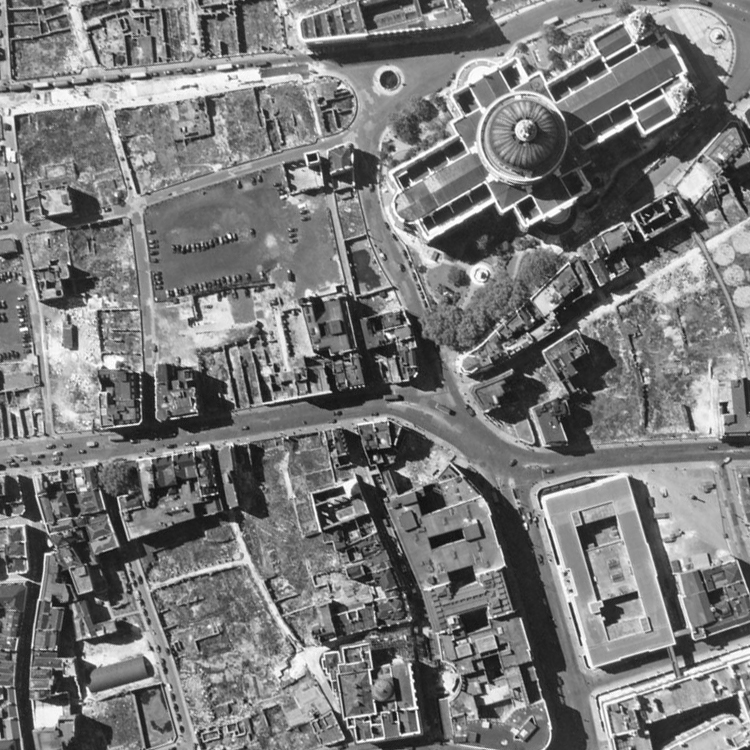

In [ ]:
cv2_imshow(img_)

In [ ]:
img1=cv2.cvtColor(img_,cv2.COLOR_BGR2GRAY)

In [ ]:
img= cv2.imread('/content/drive/MyDrive/Datasets/Unstiched_Img/test1.jpg')

In [ ]:
img=cv2.resize(img, (0,0), fx=1,fy=1)

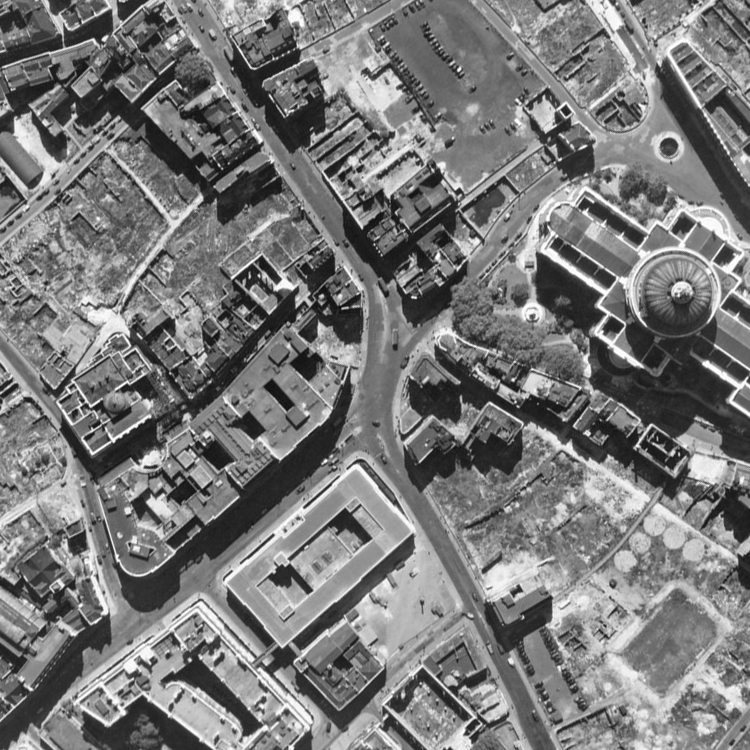

In [ ]:
cv2_imshow(img)

In [ ]:
img2=cv2.cvtColor(img,cv2.COLOR_BGR2GRAY)

In [ ]:
sift=cv2.SIFT_create()

In [ ]:
kp1,des1=sift.detectAndCompute(img1,None)

In [ ]:
kp2,des2=sift.detectAndCompute(img2,None)

In [ ]:
i1=cv2.drawKeypoints(img_,kp1,None)

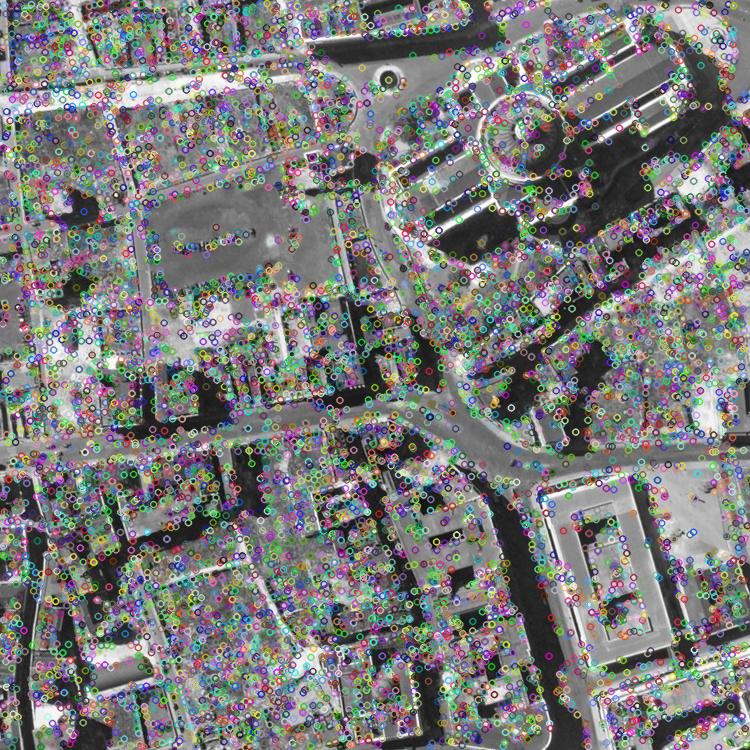

In [ ]:
cv2_imshow(i1)

In [ ]:
i2=cv2.drawKeypoints(img2,kp2,None)

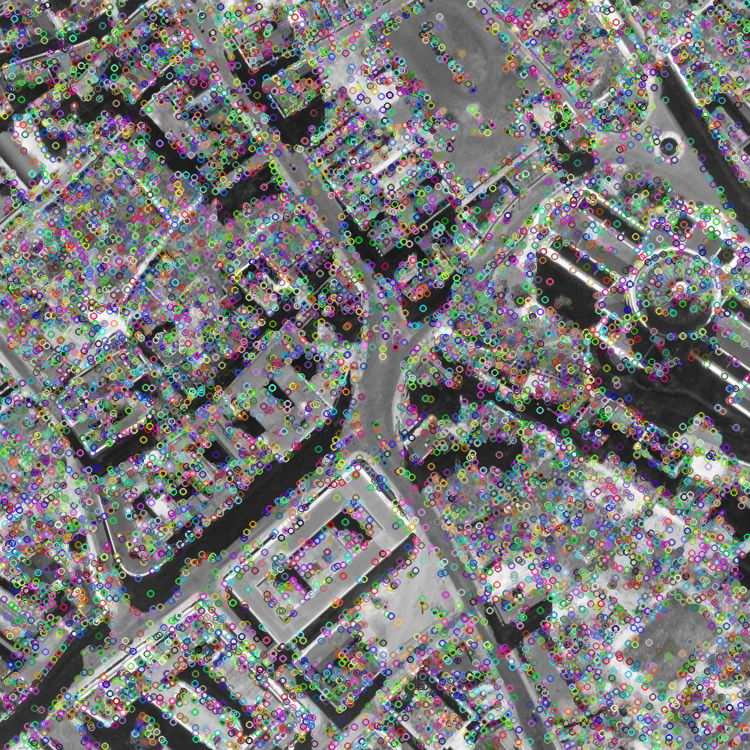

In [ ]:
cv2_imshow(i2)

In [ ]:
FLANN_INDEX_KDTREE=0

In [ ]:
index_params=dict(algorithm=FLANN_INDEX_KDTREE,trees=5)

In [ ]:
search_params=dict(checks=50)

In [ ]:
flann=cv2.FlannBasedMatcher(index_params,search_params)

In [ ]:
match=cv2.BFMatcher()

In [ ]:
matches=flann.knnMatch(des1,des2,k=2)

In [ ]:
good=[]

In [ ]:
for m,n in matches:
  if m.distance<0.05*n.distance:
    good.append(m)

In [ ]:
draw_params=dict(matchColor=(0,255,0) ,
                 singlePointColor=None,
                 flags=2)

In [ ]:
imgoutput=cv2.drawMatches(img_,kp1,img,kp2,good,None,**draw_params)

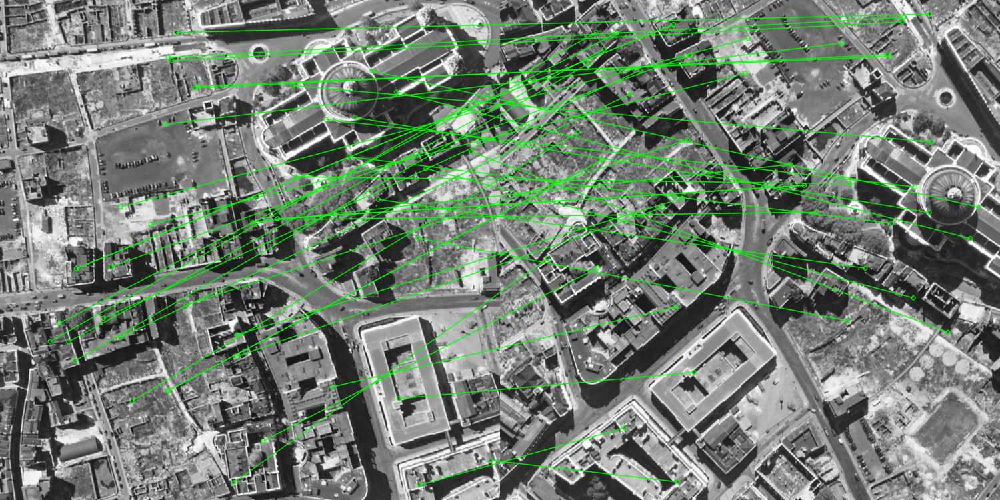

In [ ]:
cv2_imshow(imgoutput)

In [ ]:
MIN_MATCH_COUNT=10

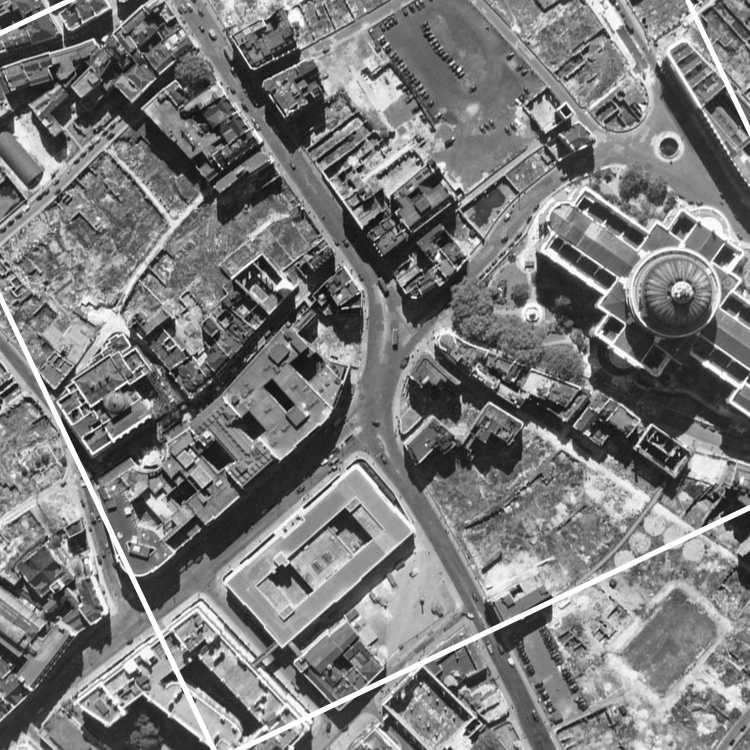

In [ ]:
if len(good) > MIN_MATCH_COUNT:
  src_pts=np.float32([kp1[m.queryIdx].pt for m in good]).reshape(-1,1,2)
  dst_pts=np.float32([kp2[m.trainIdx].pt for m in good]).reshape(-1,1,2)
  M,mask=cv2.findHomography(src_pts,dst_pts,cv2.RANSAC,5.0)
  h,w=img1.shape
  pts=np.float32([[0,0],[0,h-1],[w-1,h-1],[w-1,0]]).reshape(-1,1,2)
  dst=cv2.perspectiveTransform(pts,M)
  img2=cv2.polylines(img2,[np.int32(dst)],True,255,3,cv2.LINE_AA)
  cv2_imshow(img2)
else:
  print("Not enough matches count found")

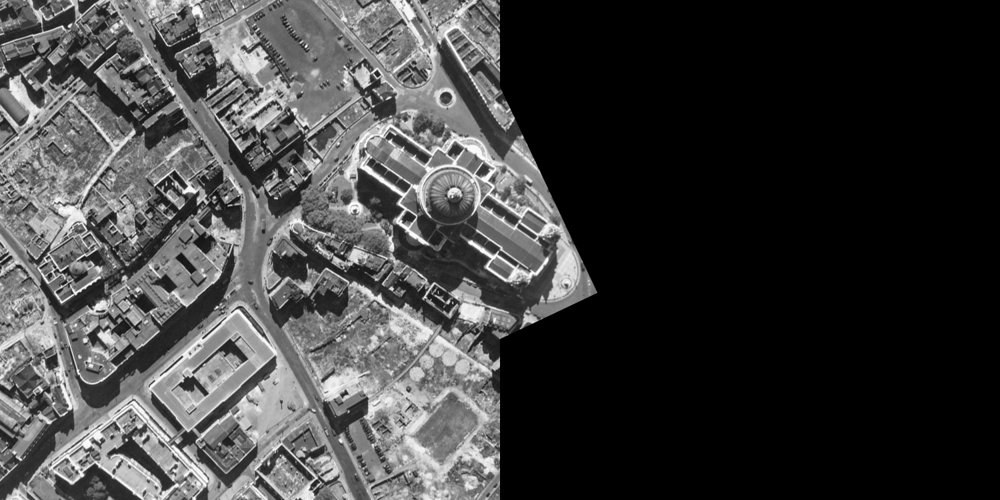

In [ ]:
dst=cv2.warpPerspective(img_,M,(img.shape[1]+img_.shape[1],img.shape[0]))
dst[0:img.shape[0],0:img.shape[1]]=img
cv2_imshow(dst)

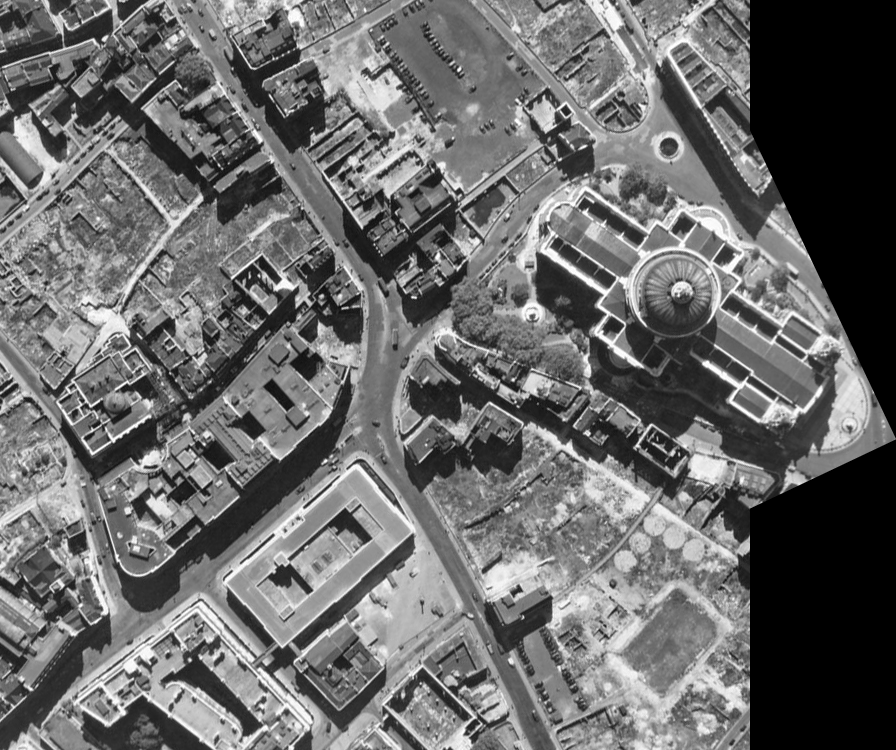

In [ ]:
def trim (frame):
  if not np.sum(frame[0]):
    return trim(frame[1:])
  if not np.sum(frame[-1]):
    return trim(frame[:-2])
  if not np.sum(frame[:,0]):
    return trim(frame[:,1:])
  if not np.sum(frame[:,-1]):
    return trim(frame[:,:-2])
  return frame
cv2_imshow(trim(dst))